In [1]:
import numpy as np
import pandas as pd
import xpress as xp


## 1. Data Exploration

In [2]:
# read-data
TransactionsInput = pd.read_excel("231013_Transactions_Input.xlsx")

In [3]:
FuardCases = pd.read_excel("231013_Fraud_Cases.xlsx")
CustomerBase = pd.read_excel("231013_Customer_Base.xlsx")

In [4]:
TransactionsInput["description"].nunique()

347

In [5]:
TransactionsInput

,transaction_id,description,Amount,category,date,month,customer_id,type,In_or_Out,bank_to,bank_from,transac_prob,description_prob,priority
0,1,Salary Deposit - XYZ Corporation,11474.33021,Income,2023-10-01,October,17699,income,paid_in,bank_A,bank_A,NaN,NaN,3
1,2,Online Retailer - Electronics Purchase,199.99000,Online Shopping,2023-10-01,October,10298,spending,paid_out,bank_A,bank_E,0.78,0.25,3
2,3,Utilities Payment - Internet Service,60.00000,Utilities,2023-10-01,October,10298,spending,paid_out,bank_C,bank_E,0.30,0.22,1
3,4,Rent Payment,1500.00000,Housing,2023-10-01,October,14507,spending,paid_out,bank_D,bank_E,0.57,0.53,3
4,5,Paycheck Deposit - Company Name,10480.68449,Income,2023-10-01,October,14507,income,paid_in,bank_E,bank_D,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315177,315178,Grocery Shopping - Super Value Mart,55.25000,Groceries,2024-07-31,July,15026,spending,paid_out,bank_C,bank_B,0.42,0.17,1
315178,315179,JCPenney - Discount Fashion,40.00000,Shopping,2024-07-31,July,11908,spending,paid_out,bank_D,bank_A,0.36,0.36,1
315179,315180,Gas Station - Fuel Purchase,40.45000,Transportation,2024-07-31,July,10291,spending,paid_out,bank_D,bank_D,0.28,0.64,1
315180,315181,ATM Withdrawal - PQR Bank ATM,80.00000,Cash Withdrawal,2024-07-31,July,18543,spending,paid_out,NaN,bank_A,0.24,0.23,2


In [6]:
CustomerBase

,customer_id,home_bank,customer_prob
0,10298,bank_E,0.49
1,14507,bank_E,0.35
2,14558,bank_E,0.45
3,13453,bank_E,0.63
4,19629,bank_D,0.79
...,...,...,...
480,15364,bank_E,0.42
481,13462,bank_A,0.53
482,18020,bank_E,0.38
483,16643,bank_B,0.26


In [7]:
# TransactionsInput_clean = TransactionsInput.drop('description_prob', axis=1)
# TransactionsInput_clean = TransactionsInput.drop(TransactionsInput[TransactionsInput['In_or_Out'] == 'paid_in'].index)


In [8]:
FuardCases

,transaction_id,is_scam_transaction,fraud_type,case_id
0,187,1,AdvanceFee,5415844
1,247,1,Impersonation,4280670
2,818,1,Impersonation,6956462
3,891,1,Purchase,2702984
4,1142,1,Purchase,3493741
...,...,...,...,...
2476,313591,1,Impersonation,5711663
2477,314245,1,AdvanceFee,8032096
2478,314259,1,Purchase,1154155
2479,314411,1,AdvanceFee,4460117


### Find the seasonality

In [9]:
Fuard_time = pd.merge(TransactionsInput,FuardCases, on="transaction_id")[["date","month"]]
Fuard_time['month'] = Fuard_time.apply(lambda row: row['month'] + str(row['date'].year), axis=1)
unique_date, counts_date = np.unique(Fuard_time[['date']], return_counts=True)
unique_month, counts_month = np.unique(Fuard_time[['month']], return_counts=True)
frequency_date = dict(zip(unique_date, counts_date))
frequency_month = dict(zip(unique_month, counts_month))  
print(frequency_date)
print(frequency_month)

{numpy.datetime64('2023-10-01T00:00:00.000000000'): 18, numpy.datetime64('2023-10-02T00:00:00.000000000'): 6, numpy.datetime64('2023-10-03T00:00:00.000000000'): 20, numpy.datetime64('2023-10-04T00:00:00.000000000'): 7, numpy.datetime64('2023-10-05T00:00:00.000000000'): 8, numpy.datetime64('2023-10-06T00:00:00.000000000'): 8, numpy.datetime64('2023-10-07T00:00:00.000000000'): 4, numpy.datetime64('2023-10-08T00:00:00.000000000'): 8, numpy.datetime64('2023-10-09T00:00:00.000000000'): 9, numpy.datetime64('2023-10-10T00:00:00.000000000'): 6, numpy.datetime64('2023-10-11T00:00:00.000000000'): 5, numpy.datetime64('2023-10-12T00:00:00.000000000'): 13, numpy.datetime64('2023-10-13T00:00:00.000000000'): 7, numpy.datetime64('2023-10-14T00:00:00.000000000'): 8, numpy.datetime64('2023-10-15T00:00:00.000000000'): 9, numpy.datetime64('2023-10-16T00:00:00.000000000'): 6, numpy.datetime64('2023-10-17T00:00:00.000000000'): 6, numpy.datetime64('2023-10-18T00:00:00.000000000'): 8, numpy.datetime64('2023-1

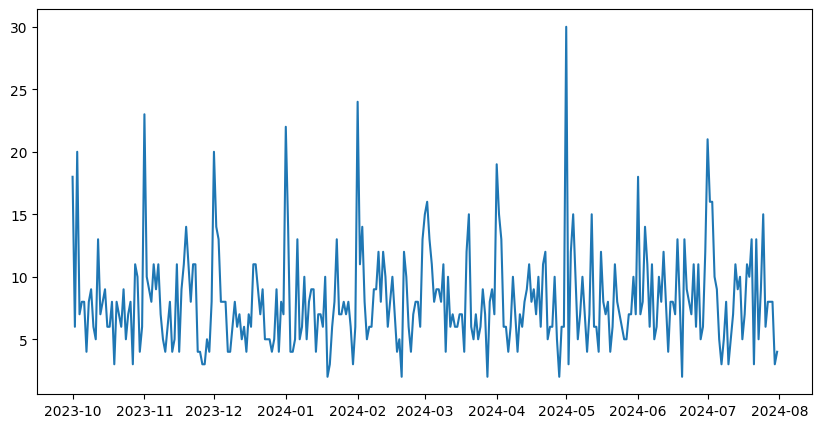

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(unique_date,counts_date)

In [11]:
# in proportion
TransactionsInput['if_fraud'] = TransactionsInput['transaction_id'].apply(lambda x: 1 if x in FuardCases['transaction_id'].values else 0)
TransactionsInput_ratio = TransactionsInput[["date","if_fraud"]]


In [12]:
label_ratio = TransactionsInput_ratio.groupby('date')['if_fraud'].mean()
label_ratio

date
2023-10-01    0.007453
2023-10-02    0.004386
2023-10-03    0.014524
2023-10-04    0.006162
2023-10-05    0.008584
                ...   
2024-07-27    0.008621
2024-07-28    0.008547
2024-07-29    0.009313
2024-07-30    0.003036
2024-07-31    0.004264
Name: if_fraud, Length: 305, dtype: float64

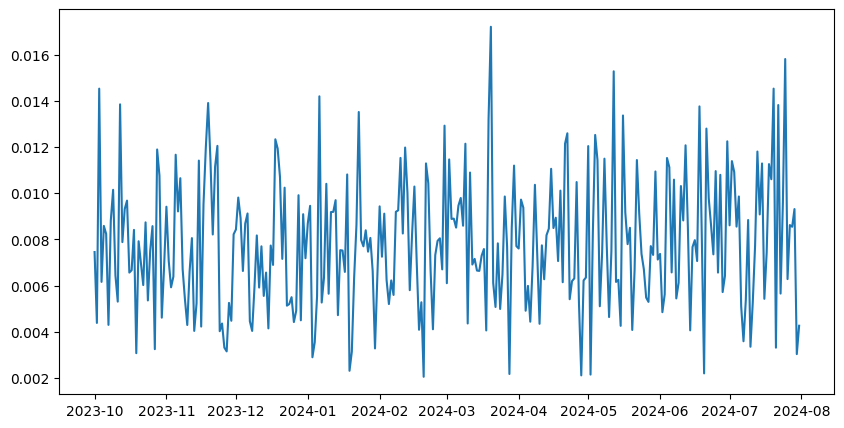

In [13]:
plt.figure(figsize=(10,5))
plt.plot(unique_date,label_ratio)

In [14]:
# TransactionsInput_clean = TransactionsInput_clean[["In_or_Out"] == "paid_in"]

## 2. Create a problem with xpress module

#### 2.1 The basic model in a single day. (Ignore the learn model)

In [15]:
# prepare data
# https://www.geeksforgeeks.org/how-to-do-a-vlookup-in-python-using-pandaabss/
TransactionsInput_label_id = np.array(FuardCases["transaction_id"])
TransactionsInput = TransactionsInput
TransactionsInput["is_fraud"] = 0
TransactionsInput["is_fraud"].loc[TransactionsInput_label_id-1] = 1

TransactionsInput_clean = TransactionsInput.drop(TransactionsInput[TransactionsInput['In_or_Out'] == 'paid_in'].index)
TransactionsInput_clean = TransactionsInput_clean.drop(TransactionsInput[TransactionsInput['category'] == 'Cash Withdrawal'].index)

TransactionsInput_clean = pd.merge(TransactionsInput_clean, CustomerBase, on='customer_id', how='left')

# investigation time dataframe
Inestigation_time = pd.DataFrame(data={'priority':[1, 2, 3, 4], 'investigation_time':[0.25, 0.5, 1, 2]}, index=([0, 1, 2, 3]))

# merge inverstigation time with the input data
TransactionsInput_clean = pd.merge(TransactionsInput_clean, Inestigation_time, on='priority', how='left')

# investigation  dataframe
Inestigation_hire = pd.DataFrame(data={'priority':[1, 2, 3, 4], 'investigation_hire':[40, 60, 100, 150]}, index=([0, 1, 2, 3]))

# merge inverstigation time with the input data
TransactionsInput_clean = pd.merge(TransactionsInput_clean, Inestigation_hire, on='priority', how='left')

C:\Users\Eliza\AppData\Local\Temp\ipykernel_28176\1887454724.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  TransactionsInput["is_fraud"].loc[TransactionsInput_label_id-1] = 1


In [16]:
TransactionsInput_clean

,transaction_id,description,Amount,category,date,month,customer_id,type,In_or_Out,bank_to,bank_from,transac_prob,description_prob,priority,if_fraud,is_fraud,home_bank,customer_prob,investigation_time,investigation_hire
0,2,Online Retailer - Electronics Purchase,199.99,Online Shopping,2023-10-01,October,10298,spending,paid_out,bank_A,bank_E,0.78,0.25,3,0,0,bank_E,0.49,1.00,100
1,3,Utilities Payment - Internet Service,60.00,Utilities,2023-10-01,October,10298,spending,paid_out,bank_C,bank_E,0.30,0.22,1,0,0,bank_E,0.49,0.25,40
2,4,Rent Payment,1500.00,Housing,2023-10-01,October,14507,spending,paid_out,bank_D,bank_E,0.57,0.53,3,0,0,bank_E,0.35,1.00,100
3,6,Online Retailer - Electronics Purchase,299.99,Online Shopping,2023-10-01,October,14507,spending,paid_out,bank_E,bank_E,0.75,0.65,3,0,0,bank_E,0.35,1.00,100
4,7,Asos - Online Fashion Shopping,55.00,Shopping,2023-10-01,October,14507,spending,paid_out,bank_B,bank_E,0.37,0.31,1,0,0,bank_E,0.35,0.25,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238152,315177,Home Improvement Store - DIY Supplies,75.40,Home Improvement,2024-07-31,July,11908,spending,paid_out,bank_D,bank_A,0.35,0.63,1,0,0,bank_A,0.32,0.25,40
238153,315178,Grocery Shopping - Super Value Mart,55.25,Groceries,2024-07-31,July,15026,spending,paid_out,bank_C,bank_B,0.42,0.17,1,0,0,bank_B,0.52,0.25,40
238154,315179,JCPenney - Discount Fashion,40.00,Shopping,2024-07-31,July,11908,spending,paid_out,bank_D,bank_A,0.36,0.36,1,0,0,bank_A,0.32,0.25,40
238155,315180,Gas Station - Fuel Purchase,40.45,Transportation,2024-07-31,July,10291,spending,paid_out,bank_D,bank_D,0.28,0.64,1,0,0,bank_D,0.35,0.25,40


In [17]:
date_list = pd.to_datetime(TransactionsInput_clean['date']).dt.date
# date_list.unique()
formatted_dates = date_list.apply(lambda date: date.strftime('%Y-%m-%d'))
date_list = formatted_dates.unique()

date = date_list[0]
TransactionsInput_clean[TransactionsInput_clean['date'] == date]

,transaction_id,description,Amount,category,date,month,customer_id,type,In_or_Out,bank_to,bank_from,transac_prob,description_prob,priority,if_fraud,is_fraud,home_bank,customer_prob,investigation_time,investigation_hire
0,2,Online Retailer - Electronics Purchase,199.99,Online Shopping,2023-10-01,October,10298,spending,paid_out,bank_A,bank_E,0.78,0.25,3,0,0,bank_E,0.49,1.00,100
1,3,Utilities Payment - Internet Service,60.00,Utilities,2023-10-01,October,10298,spending,paid_out,bank_C,bank_E,0.30,0.22,1,0,0,bank_E,0.49,0.25,40
2,4,Rent Payment,1500.00,Housing,2023-10-01,October,14507,spending,paid_out,bank_D,bank_E,0.57,0.53,3,0,0,bank_E,0.35,1.00,100
3,6,Online Retailer - Electronics Purchase,299.99,Online Shopping,2023-10-01,October,14507,spending,paid_out,bank_E,bank_E,0.75,0.65,3,0,0,bank_E,0.35,1.00,100
4,7,Asos - Online Fashion Shopping,55.00,Shopping,2023-10-01,October,14507,spending,paid_out,bank_B,bank_E,0.37,0.31,1,0,0,bank_E,0.35,0.25,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1699,2410,Credit Card Payment - American Express **** 5678,175.00,Credit Card Payment,2023-10-01,October,17647,spending,paid_out,Intrnl,bank_D,0.66,0.36,4,0,0,bank_D,0.70,2.00,150
1700,2412,Home Improvement - Paint and Supplies,110.75,Home Improvement,2023-10-01,October,17031,spending,paid_out,bank_E,bank_A,0.43,0.46,2,0,0,bank_A,0.58,0.50,60
1701,2413,Rent Payment,1200.00,Housing,2023-10-01,October,17699,spending,paid_out,bank_D,bank_A,0.64,0.38,3,0,0,bank_A,0.66,1.00,100
1702,2414,Credit Card Payment - Mastercard **** 6789,150.50,Credit Card Payment,2023-10-01,October,17390,spending,paid_out,Intrnl,bank_D,0.66,0.68,4,0,0,bank_D,0.45,2.00,150


### 2.2 Abstract the test set for testing the code - only use first 10 transactios

In [18]:

TransactionsInput_clean_test = TransactionsInput_clean[0:10]
TransactionsInput_clean_test


,transaction_id,description,Amount,category,date,month,customer_id,type,In_or_Out,bank_to,bank_from,transac_prob,description_prob,priority,if_fraud,is_fraud,home_bank,customer_prob,investigation_time,investigation_hire
0,2,Online Retailer - Electronics Purchase,199.99,Online Shopping,2023-10-01,October,10298,spending,paid_out,bank_A,bank_E,0.78,0.25,3,0,0,bank_E,0.49,1.00,100
1,3,Utilities Payment - Internet Service,60.00,Utilities,2023-10-01,October,10298,spending,paid_out,bank_C,bank_E,0.30,0.22,1,0,0,bank_E,0.49,0.25,40
2,4,Rent Payment,1500.00,Housing,2023-10-01,October,14507,spending,paid_out,bank_D,bank_E,0.57,0.53,3,0,0,bank_E,0.35,1.00,100
3,6,Online Retailer - Electronics Purchase,299.99,Online Shopping,2023-10-01,October,14507,spending,paid_out,bank_E,bank_E,0.75,0.65,3,0,0,bank_E,0.35,1.00,100
4,7,Asos - Online Fashion Shopping,55.00,Shopping,2023-10-01,October,14507,spending,paid_out,bank_B,bank_E,0.37,0.31,1,0,0,bank_E,0.35,0.25,40
5,9,Fuel Purchase - Gas Station,42.75,Transportation,2023-10-01,October,14507,spending,paid_out,bank_E,bank_E,0.39,0.44,1,0,0,bank_E,0.35,0.25,40
6,10,Fuel Purchase - Gas Station,45.60,Transportation,2023-10-01,October,14507,spending,paid_out,bank_A,bank_E,0.24,0.21,1,0,0,bank_E,0.35,0.25,40
7,11,Phone Bill Payment - Wireless Provider,70.00,Utilities,2023-10-01,October,14507,spending,paid_out,bank_A,bank_E,0.38,0.16,1,0,0,bank_E,0.35,0.25,40
8,12,Phone Bill Payment - Mobile Co.,65.00,Utilities,2023-10-01,October,14558,spending,paid_out,bank_A,bank_E,0.57,0.30,1,0,0,bank_E,0.45,0.25,40
9,13,Rent Payment,1500.00,Housing,2023-10-01,October,14558,spending,paid_out,bank_C,bank_E,0.63,0.41,3,0,0,bank_E,0.45,1.00,100


### 2.3 Prepare the data

In [19]:
# # data (parameeters) needed in this problem
# # NOTE THAT: very strightforward way in this case as this is the idea stage.
# # still need to abstract the single instead of a whole data set
# x_length = len(TransactionsInput_clean_test["transaction_id"])
# y_length = len(TransactionsInput_clean_test["transaction_id"])
# Prob_transac = TransactionsInput_clean_test["transac_prob"]
# # Prob_description = TransactionsInput_clean_test["description_prob"]  

# Customer_test = pd.merge(TransactionsInput_clean_test, CustomerBase, on="customer_id", how="left")[['transaction_id','customer_id','home_bank','customer_prob']]
# Prob_customer = Customer_test["customer_prob"]

# # bank here is used to distribute the investigation resiponsibility
# B = ["bank_A","bank_B","bank_C","bank_D","bank_E"]
# Bank_to = TransactionsInput_clean_test["bank_to"]
# Bank_from = TransactionsInput_clean_test["bank_from"]

# # Parameters
# Bank = ["A", "B", "C", "D", "E"]
Investigarion_team = [8, 12, 10, 10, 10]

# Priority = TransactionsInput_clean_test["priority"]
# # Investigation_time_dict = {1:0.25, 2:0.5, 3:1, 4:2} 
# # Investigation_hire_exter_dict = {1:40, 2:60, 3:100, 4:150} 
# # Investigation_target_success = {1:0.5, 2:0.6, 3:0.7, 4:0.8}


In [20]:
# one-hot encoding
# decide which bank will join the investigation
B = ["bank_A","bank_B","bank_C","bank_D","bank_E"]
Bank_to = TransactionsInput_clean_test["bank_to"]
Bank_from = TransactionsInput_clean_test["bank_from"]

Bank_to_onehot = pd.get_dummies(Bank_to, dtype=int)
Bank_from_onehot = pd.get_dummies(Bank_from, dtype=int)
array_1 = Bank_to_onehot+Bank_from_onehot
array_2 = Bank_to_onehot+Bank_from_onehot

# find p4 row
p4 = TransactionsInput_clean_test[TransactionsInput_clean_test["priority"] == 4].index
array_1.loc[p4] = 0

# construct the constraints to pirority 4
not_p4 = TransactionsInput_clean_test.index.difference(p4)
array_2.loc[not_p4] = 0



### 2.4 Define the daily model function

#### 2.4.1 Daily Model with Alpha is the number of hiring external investgator

In [21]:
def daily_moel(alpha, beta_trans, beta_customer, TransactionsInput_clean_test, C4_cont,inve_team_size):
    # Create a problem called transaction
    prob = xp.problem(name='transaction_daily') 

    # declaration
    number_of_transactions = len(TransactionsInput_clean_test)
    # number_of_priorities = 4
    number_of_banks = 5
    transactions = range(number_of_transactions)
    # priorities = range(number_of_priorities)
    banks = range(number_of_banks)

    # prepare the data
    # decide which bank will join the investigation
    Bank_to = TransactionsInput_clean_test["bank_to"]
    Bank_from = TransactionsInput_clean_test["bank_from"]
    Bank_to_onehot = pd.get_dummies(Bank_to, dtype=int)
    Bank_to_onehot = Bank_to_onehot.drop('Intrnl', axis=1)
    Bank_from_onehot = pd.get_dummies(Bank_from, dtype=int)
    # bank_names = np.array(['bank_A', 'bank_B', 'bank_C', 'bank_D', 'bank_E'])
    # Bank_to_onehot = np.array([1 if TransactionsInput_clean_test.iloc[i, 9] == bank_names[b] else 0 
    #                     for b in banks for i in transactions]).reshape(number_of_banks, number_of_transactions)
    # Bank_from_onehot = np.array([1 if TransactionsInput_clean_test.iloc[i, 10] == bank_names[b] else 0 
    #                     for b in banks for i in transactions]).reshape(number_of_banks, number_of_transactions)
    array_1 = np.add(Bank_to_onehot, Bank_from_onehot)
    array_2 = np.add(Bank_to_onehot, Bank_from_onehot)

    # find p4 row
    p4 = TransactionsInput_clean_test[TransactionsInput_clean_test["priority"] == 4].index
    array_1.loc[p4] = 0
    trans_array_1 = array_1.T
    # trans_array_1 = np.array(trans_array_1)
    trans_array_1 = np.nan_to_num(trans_array_1)

    # find not p4 row
    not_p4 = TransactionsInput_clean_test.index.difference(p4)
    array_2.loc[not_p4] = 0
    trans_array_2 = array_2.T
    # trans_array_2 = np.array(trans_array_2)
    trans_array_2 = np.nan_to_num(trans_array_2)

    # investigation time and hire cose
    Investigation_time = np.array(TransactionsInput_clean_test["investigation_time"])
    Investigation_hire = np.array(TransactionsInput_clean_test["investigation_hire"])

    # value
    value =np.array(TransactionsInput_clean_test["Amount"])

    # prbability
    TP = np.array(TransactionsInput_clean_test["transac_prob"])
    TP = np.nan_to_num(TP)
    CP = np.array(TransactionsInput_clean_test["customer_prob"])
    CP = np.nan_to_num(CP)

    # add variables
    X = np.array([xp.var(vartype=xp.binary, name='X_{0}_{1}'.format(b+1, i+1)) 
                    for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    X4 = np.array([xp.var(vartype=xp.binary, name='X4_{0}_{1}'.format(b+1, i+1)) 
                        for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    Z = np.array([xp.var(vartype=xp.binary, name='Z_{0}_{1}'.format(i+1, b+1)) 
                        for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    Z4 = np.array([xp.var(vartype=xp.binary, name='Z4_{0}_{1}'.format(i+1, b+1)) 
                        for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    C = np.array([xp.var(vartype=xp.integer, name='C_{0}'.format(b+1))
                        for b in banks], dtype=xp.npvar).reshape(number_of_banks, )
    C4 = np.array([xp.var(vartype=xp.integer, name='C4_{0}'.format(b+1))
                        for b in banks], dtype=xp.npvar).reshape(number_of_banks, )

    prob.addVariable(X, X4, Z, Z4, C, C4)

    # set constraints
    prob.addConstraint(X[b,i] + X4[b,i] + Z[b,i] + Z4[b,i] <= 1 for i in transactions for b in banks)

    prob.addConstraint(xp.Sum(X[b,i] * Investigation_time[i] for i in transactions) <= C[b] for b in banks)
    prob.addConstraint(xp.Sum(X4[b,i] * Investigation_time[i] for i in transactions ) <= C4[b] for b in banks)

    prob.addConstraint((C[n] + C4[n] + C4_cont[n]) <= inve_team_size[n] for n in banks)

    prob.addConstraint(X[b,i] <= trans_array_1[b,i] for i in transactions for b in banks)
    prob.addConstraint(Z[b,i] <= trans_array_1[b,i] for i in transactions for b in banks)
    prob.addConstraint(X4[b,i] <= trans_array_2[b,i] for i in transactions for b in banks)
    prob.addConstraint(Z4[b,i] <= trans_array_2[b,i] for i in transactions for b in banks)

    prob.addConstraint(xp.Sum(Z[n] + Z4[n] for n in banks) <= alpha)

    # set objective function
    prob.setObjective(xp.Sum(value[i]*(beta_trans*TP[i] + beta_customer*CP[i])*(Z[n, i] + X[n, i] + Z4[n, i] + X4[n, i])
                  - (Z4[n, i] + Z[n, i])*Investigation_hire[i] for i in transactions for n in banks),
                    sense=xp.maximize)

    # get solution
    prob.solve()

    x_optimal = prob.getSolution(X)
    x_4_optimal = prob.getSolution(X4)
    Ex_hire_optimal = prob.getSolution(Z)
    Ex_hire_4_optimal = prob.getSolution(Z4)
    C4_cont = prob.getSolution(C4)

    cost = prob.getObjVal()
    
    
    return x_optimal, x_4_optimal, Ex_hire_optimal, Ex_hire_4_optimal, cost, C4_cont 
    # return 


#### 2.4.2 Threadhold daily model

In [23]:
# C4_cont = [0,0,0,0,0]
# cost = daily_moel(2,0.5, 0.5, TransactionsInput_clean_test,C4_cont,Investigarion_team)
# print(cost)

In [24]:
# add objective value
# expect value on investigation cost
# prob_daily.addObjective()

In [25]:
# add constraints
# prob_daily.addConstraint(i for i in x_length x[i]*Investigation_time[Priority[i]-1] <= sum(c))
# prob_daily.addConstraint(all(x[i] * Investigation_time[Priority[i]-1] <= sum(Bank_to_onehot[b, i] * c[b, i] + Bank_from_onehot[b, i] * c[b, i] for b in B) for i in range(len(TransactionsInput_clean_test))))
# dimension

## 3. Construct the optimal model

### 3.1 label the Fraud transaction

In [26]:
FuardCases

,transaction_id,is_scam_transaction,fraud_type,case_id
0,187,1,AdvanceFee,5415844
1,247,1,Impersonation,4280670
2,818,1,Impersonation,6956462
3,891,1,Purchase,2702984
4,1142,1,Purchase,3493741
...,...,...,...,...
2476,313591,1,Impersonation,5711663
2477,314245,1,AdvanceFee,8032096
2478,314259,1,Purchase,1154155
2479,314411,1,AdvanceFee,4460117


### 3.2 Construct the optimal model

In [27]:
def optimal_model(TransactionsInput_clean_test, C4_cont, inve_team_size):
    # Create a problem called transaction
    prob = xp.problem(name='transaction_daily') 

    # declaration
    number_of_transactions = len(TransactionsInput_clean_test)
    # number_of_priorities = 4
    number_of_banks = 5
    transactions = range(number_of_transactions)
    # priorities = range(number_of_priorities)
    banks = range(number_of_banks)

    # prepare the data
    # decide which bank will join the investigation
    Bank_to = TransactionsInput_clean_test["bank_to"]
    Bank_from = TransactionsInput_clean_test["bank_from"]
    Bank_to_onehot = pd.get_dummies(Bank_to, dtype=int)
    Bank_to_onehot = Bank_to_onehot.drop('Intrnl', axis=1)
    Bank_from_onehot = pd.get_dummies(Bank_from, dtype=int)
    # bank names
    # bank_names = np.array(['bank_A', 'bank_B', 'bank_C', 'bank_D', 'bank_E'])
    # Bank_to_onehot = np.array([1 if TransactionsInput_clean_test.iloc[i, 9] == bank_names[b] else 0 
    #                     for b in banks for i in transactions]).reshape(number_of_banks, number_of_transactions)
    # Bank_from_onehot = np.array([1 if TransactionsInput_clean_test.iloc[i, 10] == bank_names[b] else 0 
    #                     for b in banks for i in transactions]).reshape(number_of_banks, number_of_transactions)
    array_1 = np.add(Bank_to_onehot, Bank_from_onehot)
    array_2 = np.add(Bank_to_onehot, Bank_from_onehot)

    # find p4 row
    p4 = TransactionsInput_clean_test[TransactionsInput_clean_test["priority"] == 4].index
    array_1.loc[p4] = 0
    trans_array_1 = array_1.T
    # trans_array_1 = np.array(trans_array_1)
    trans_array_1 = np.nan_to_num(trans_array_1)

    # find not p4 row
    not_p4 = TransactionsInput_clean_test.index.difference(p4)
    array_2.loc[not_p4] = 0
    trans_array_2 = array_2.T
    # trans_array_2 = np.array(trans_array_2)
    trans_array_2 = np.nan_to_num(trans_array_2)

    # investigation time and hire cose
    Investigation_time = np.array(TransactionsInput_clean_test["investigation_time"])
    Investigation_hire = np.array(TransactionsInput_clean_test["investigation_hire"])

    # value
    value =np.array(TransactionsInput_clean_test["Amount"])

    # if Fraud
    F = np.array(TransactionsInput_clean_test["is_fraud"])

    # prbability
    TP = np.array(TransactionsInput_clean_test["transac_prob"])
    TP = np.nan_to_num(TP)
    CP = np.array(TransactionsInput_clean_test["customer_prob"])
    CP = np.nan_to_num(CP)

    # add variables
    X = np.array([xp.var(vartype=xp.binary, name='X_{0}_{1}'.format(b+1, i+1)) 
                    for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    X4 = np.array([xp.var(vartype=xp.binary, name='X4_{0}_{1}'.format(b+1, i+1)) 
                        for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    Z = np.array([xp.var(vartype=xp.binary, name='Z_{0}_{1}'.format(i+1, b+1)) 
                        for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    Z4 = np.array([xp.var(vartype=xp.binary, name='Z4_{0}_{1}'.format(i+1, b+1)) 
                        for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    C = np.array([xp.var(vartype=xp.integer, name='C_{0}'.format(b+1))
                        for b in banks], dtype=xp.npvar).reshape(number_of_banks, )
    C4 = np.array([xp.var(vartype=xp.integer, name='C4_{0}'.format(b+1))
                        for b in banks], dtype=xp.npvar).reshape(number_of_banks, )

    prob.addVariable(X, X4, Z, Z4, C, C4)

    # set constraints
    prob.addConstraint(X[b,i] + X4[b,i] + Z[b,i] + Z4[b,i] <= 1 for i in transactions for b in banks)

    prob.addConstraint(xp.Sum(X[b,i] * Investigation_time[i] for i in transactions) <= C[b] for b in banks)
    prob.addConstraint(xp.Sum(X4[b,i] * Investigation_time[i] for i in transactions ) <= C4[b] for b in banks)

    prob.addConstraint((C[n] + C4[n] + C4_cont[n]) <= inve_team_size[n] for n in banks)

    prob.addConstraint(X[b,i] <= trans_array_1[b,i] for i in transactions for b in banks)
    prob.addConstraint(Z[b,i] <= trans_array_1[b,i] for i in transactions for b in banks)
    prob.addConstraint(X4[b,i] <= trans_array_2[b,i] for i in transactions for b in banks)
    prob.addConstraint(Z4[b,i] <= trans_array_2[b,i] for i in transactions for b in banks)


    # set objective function
    # prob.setObjective(xp.Sum(value[i]*(beta_trans*TP[i] + beta_customer*CP[i])*(1 - Z[n, i] - X[n, i] - Z4[n, i] - X4[n, i])
    #               + (Z4[n, i] + Z[n, i])*Investigation_hire[i] for i in transactions for n in banks),
    #                 sense=xp.minimize)
    prob.setObjective(xp.Sum(value[i]*(F[i])*(Z[n, i] + X[n, i] + Z4[n, i] + X4[n, i])
                  - (Z4[n, i] + Z[n, i])*Investigation_hire[i] for i in transactions for n in banks),
                    sense=xp.maximize)

    # get solution
    prob.solve()
    print("model start")
    
    # x_optimal = prob.getSolution(X)
    # x_4_optimal = prob.getSolution(X4)
    # Ex_hire_optimal = prob.getSolution(Z)
    # Ex_hire_4_optimal = prob.getSolution(Z4)
    C4_cont = prob.getSolution(C4)

    cost = prob.getObjVal()
    
  
    return cost, C4_cont


In [28]:
# # TEST
# TransactionsInput_clean_test = TransactionsInput_clean[:10]
# TransactionsInput_clean_test
# C4_cont = [0,0,0,0,0]
# optimal_test_cost = optimal_model(TransactionsInput_clean_test, C4_cont, Investigarion_team)

## 4. Find alpha star by grid search

### 4.1 Set the grid search data

In [29]:
# from data exxploration model, we found that there is at most 30 fraud transaction
print("max:", np.max(counts_date))
print("min:", np.min(counts_date))
print("mean:", np.mean(counts_date))
print("median:", np.median(counts_date))

max: 30
min: 2
mean: 8.134426229508197
median: 7.0


In [43]:
# alpha_grid = np.arange(0,0)
alpha_grid = [0,1,2,3,4,5]

In [31]:
TransactionsInput_clean

,transaction_id,description,Amount,category,date,month,customer_id,type,In_or_Out,bank_to,bank_from,transac_prob,description_prob,priority,if_fraud,is_fraud,home_bank,customer_prob,investigation_time,investigation_hire
0,2,Online Retailer - Electronics Purchase,199.99,Online Shopping,2023-10-01,October,10298,spending,paid_out,bank_A,bank_E,0.78,0.25,3,0,0,bank_E,0.49,1.00,100
1,3,Utilities Payment - Internet Service,60.00,Utilities,2023-10-01,October,10298,spending,paid_out,bank_C,bank_E,0.30,0.22,1,0,0,bank_E,0.49,0.25,40
2,4,Rent Payment,1500.00,Housing,2023-10-01,October,14507,spending,paid_out,bank_D,bank_E,0.57,0.53,3,0,0,bank_E,0.35,1.00,100
3,6,Online Retailer - Electronics Purchase,299.99,Online Shopping,2023-10-01,October,14507,spending,paid_out,bank_E,bank_E,0.75,0.65,3,0,0,bank_E,0.35,1.00,100
4,7,Asos - Online Fashion Shopping,55.00,Shopping,2023-10-01,October,14507,spending,paid_out,bank_B,bank_E,0.37,0.31,1,0,0,bank_E,0.35,0.25,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238152,315177,Home Improvement Store - DIY Supplies,75.40,Home Improvement,2024-07-31,July,11908,spending,paid_out,bank_D,bank_A,0.35,0.63,1,0,0,bank_A,0.32,0.25,40
238153,315178,Grocery Shopping - Super Value Mart,55.25,Groceries,2024-07-31,July,15026,spending,paid_out,bank_C,bank_B,0.42,0.17,1,0,0,bank_B,0.52,0.25,40
238154,315179,JCPenney - Discount Fashion,40.00,Shopping,2024-07-31,July,11908,spending,paid_out,bank_D,bank_A,0.36,0.36,1,0,0,bank_A,0.32,0.25,40
238155,315180,Gas Station - Fuel Purchase,40.45,Transportation,2024-07-31,July,10291,spending,paid_out,bank_D,bank_D,0.28,0.64,1,0,0,bank_D,0.35,0.25,40


In [32]:
date_list = pd.to_datetime(TransactionsInput_clean['date']).dt.date
# date_list.unique()
formatted_dates = date_list.apply(lambda date: date.strftime('%Y-%m-%d'))
date_list = formatted_dates.unique()
# date_list = to_datetime(data['date']) = 

In [35]:
def parameter_model(cost_optimal ,X ,X4 ,Z ,Z4 , TransactionsInput_clean_test):
    # declaration
    number_of_transactions = len(TransactionsInput_clean_test)
    # number_of_priorities = 4
    number_of_banks = 5
    transactions = range(number_of_transactions)
    # priorities = range(number_of_priorities)
    banks = range(number_of_banks)

    # if Fraud
    F = np.array(TransactionsInput_clean_test["is_fraud"])

    # investigation hire cose
    Investigation_hire = np.array(TransactionsInput_clean_test["investigation_hire"])

    # value
    value =np.array(TransactionsInput_clean_test["Amount"])
    # for i in transactions:
    #     for b in banks:
    #         value[i]
    #         prob.setObjective(xp.Sum(value[i]*(F[i])*(1 - Z[n, i] - X[n, i] - Z4[n, i] - X4[n, i])
    #               + (Z4[n, i] + Z[n, i])*Investigation_hire[i] for i in transactions for n in banks),
    #                 sense=xp.maximize)
    
    cost_daily = sum(value[i]*(F[i])*(1 - Z[n, i] - X[n, i] - Z4[n, i] - X4[n, i])
                  + (Z4[n, i] + Z[n, i])*Investigation_hire[i] for i in transactions for n in banks)

    # difference_now = cost_daily/cost_optimal
    
    return cost_optimal/cost_daily

In [36]:
len(date_list)

305

In [37]:
# TransactionsInput_clean

In [44]:
beta_list = list()
for i in range(4):
    beta_list.append([i/4, 1 - i/4])

beta_list    

[[0.0, 1.0], [0.25, 0.75], [0.5, 0.5], [0.75, 0.25]]

In [39]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

alpha_star = list()
beta_star = list()
difference_daily = list()
date_list_test = date_list
# date_list_test = "2024-05-17"
number_of_transaction = list()
C4_cont = np.array([0]*5)
C4_cont_optimal = np.array([0]*5)
X_list = list()
X4_list = list()
Z_list = list()
Z4_list = list()
cost_list = list()

for date in date_list_test:
    print(date)
    print("------------------------------------------------------------------------------------------------------------------------------------------")
    TransactionsInput_clean_test = TransactionsInput_clean.loc[TransactionsInput_clean['date'] == date]
    # difference_min = float("inf")
    difference_min = 0
    difference = list()
    
    
    cost_optimal, C4_cont_optimal = optimal_model(TransactionsInput_clean_test, C4_cont_optimal, Investigarion_team)
    print(cost_optimal,C4_cont_optimal)
    for alpha in alpha_grid:
        for beta in beta_list:
            beta1 = beta[0]
            beta2 = beta[1]

            X ,X4 ,Z ,Z4, cost, C4_cont = daily_moel(alpha, beta1, beta2, TransactionsInput_clean_test, C4_cont, Investigarion_team)

            # claim the data

            # find the case that is the closest the the real
            difference_now = parameter_model(cost_optimal ,X ,X4 ,Z ,Z4 , TransactionsInput_clean_test)
            # print(difference_now)

            difference.append(difference_now)
            if difference_now > difference_min:
                X_star = X
                X4_star = X4
                Z_star = Z
                Z4_star = Z4
                cost_optimal = cost

                difference_min = difference_now
                alpha_best = alpha
                beta1_star = beta1
                beta2_star = beta2
            # cost.append(daily_moel(alpha,0.5, 0.5, TransactionsInput_clean_test,C4_cont,Investigarion_team))
            # print(difference_min, alpha_best)

    # store the data for analyzing the success rate for each pirority
    X_list.append(X_star)
    X4_list.append(X4_star)
    Z_list.append(Z_star)
    Z4_list.append(Z4_star)
    cost_list.append(cost_optimal)
    
    difference_daily.append(difference_min)
    number_of_transaction.append(len(TransactionsInput_clean_test))
    alpha_star.append(alpha_best)
    beta_x = [beta1_star, beta2_star]
    # beta_x.append(beta1_star, beta2_star)
    beta_star.append(beta_x)

2023-10-01
------------------------------------------------------------------------------------------------------------------------------------------
Using the license file found in your Xpress installation. If you want to use this license and no longer want to see this message, use the following code before using the xpress module:
  xpress.init('D:/APP/Xpress/bin/xpauth.xpr')
FICO Xpress v9.2.2, Hyper, solve started 15:56:22, Nov 27, 2023
Heap usage: 20MB (peak 20MB, 9569KB system)
Maximizing MILP transaction_daily using up to 20 threads and up to 15GB memory, with these control settings:
OUTPUTLOG = 1
Original problem has:
     42615 rows        34090 cols        85220 elements     34090 entities
Presolved problem has:
         0 rows            0 cols            0 elements         0 entities
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 21MB (peak 44MB, 9569KB system)
Will try to keep branch and bound tree memory usage below 8.5GB
Starting concurrent solve with

In [40]:
cost_list_array = np.array(cost_list)
cost_mean = np.mean(cost_list_array)
cost_mean

14665.680738688527

In [51]:
# alpha_star = list()
# cost_daily = list()
# date_list_test = date_list[:10]
# number_of_transaction = list()
# C4_cont = np.array([0]*5)
# for date in date_list_test:
#     TransactionsInput_clean_test = TransactionsInput_clean.loc[TransactionsInput['date'] == date]
#     cost_min = float("inf")
#     cost = list()
#     for alpha in alpha_grid:
#         X ,X4 ,Z ,Z4, cost_now, C4_cont = daily_threadhold_moel(alpha,0.5, 0.5, TransactionsInput_clean_test,C4_cont,Investigarion_team)
#         cost.append(cost_now)
#         if cost_now < cost_min:
#             cost_min = cost_now
#             alpha_best = alpha
#         # cost.append(daily_moel(alpha,0.5, 0.5, TransactionsInput_clean_test,C4_cont,Investigarion_team))
#     cost_daily.append(cost)
#     number_of_transaction.append(len(TransactionsInput_clean_test))
#     alpha_star.append(alpha_best)

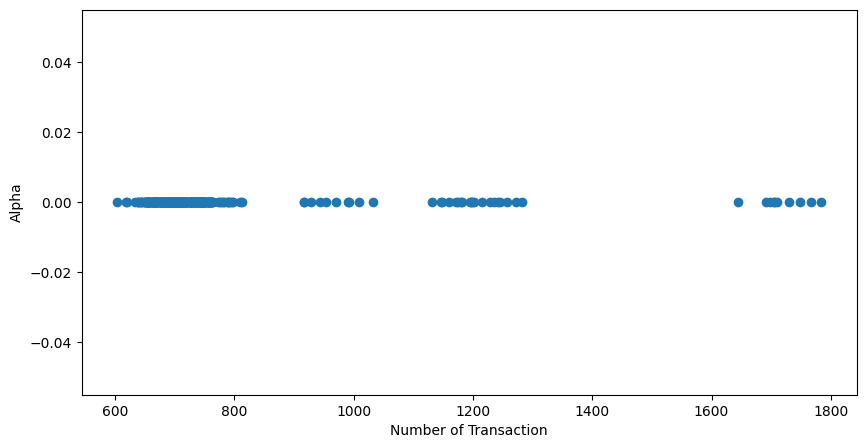

In [40]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.xlabel('Number of Transaction')
plt.ylabel('Alpha')
plt.scatter(number_of_transaction,alpha_star)
plt.savefig("alpha.pdf")

In [41]:
bata1 = [row[0] for row in beta_star]
bata2 = [row[1] for row in beta_star]

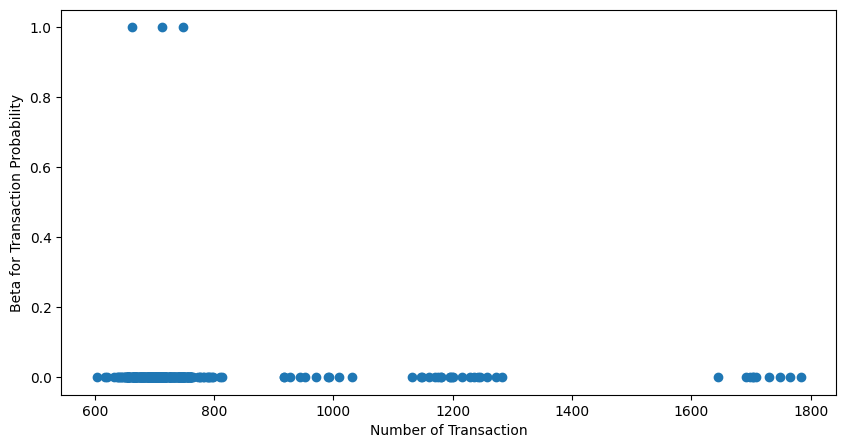

In [42]:
plt.figure(figsize=(10,5))
plt.xlabel('Number of Transaction')
plt.ylabel('Beta for Transaction Probability')
plt.scatter(number_of_transaction,bata1)
plt.savefig("beta1.pdf")

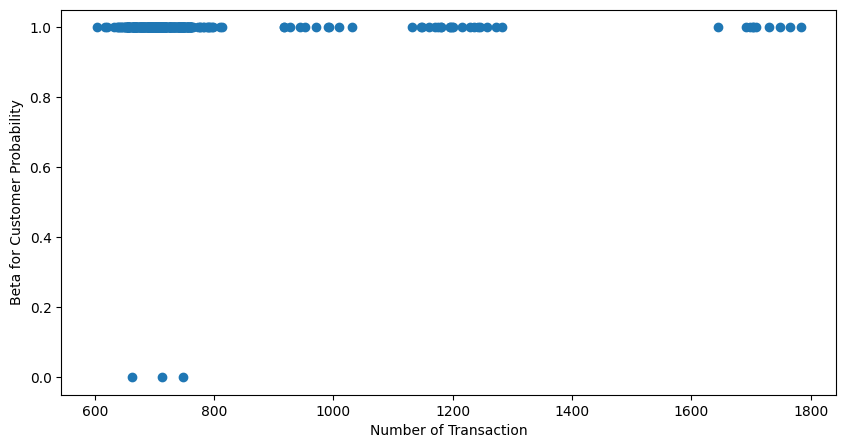

In [43]:
plt.figure(figsize=(10,5))
plt.xlabel('Number of Transaction')
plt.ylabel('Beta for Customer Probability')
plt.scatter(number_of_transaction,bata2)
plt.savefig("beta2.pdf")

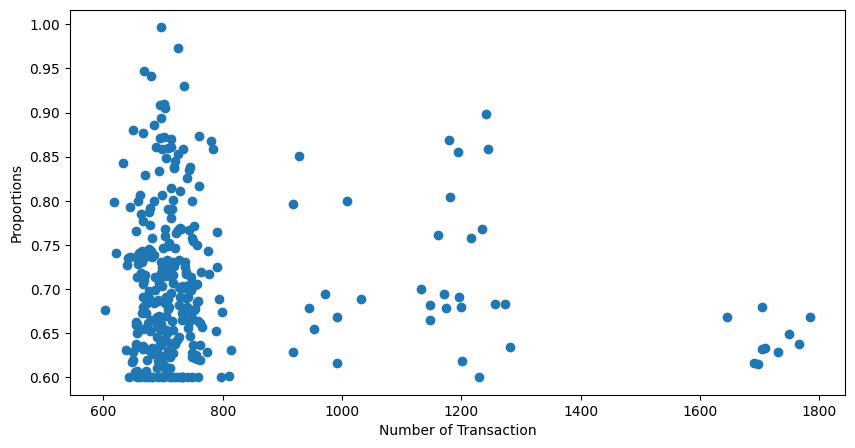

In [44]:
plt.figure(figsize=(10,5))
plt.xlabel('Number of Transaction')
plt.ylabel('Proportions')
plt.scatter(number_of_transaction,difference_daily)
plt.savefig("proportions_R.pdf")

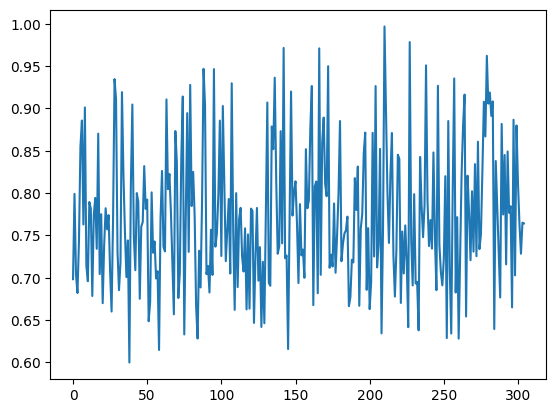

In [48]:
plt.plot(difference_daily)

## Additional Question - 11. success rate

In [36]:
import operator
import itertools

In [54]:
# # test with alpha = 0, beta1 = 0, beta2 = 1
# import os
# os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

# alpha_star = list()
# beta_star = list()
# difference_daily = list()
# date_list_test = date_list
# # date_list_test = "2024-05-17"
# number_of_transaction = list()
# C4_cont = np.array([0]*5)
# C4_cont_optimal = np.array([0]*5)
# X_list = list()
# X4_list = list()
# Z_list = list()
# Z4_list = list()
# for date in date_list_test:
#     print(date)
#     print("------------------------------------------------------------------------------------------------------------------------------------------")
#     TransactionsInput_clean_test = TransactionsInput_clean.loc[TransactionsInput_clean['date'] == date]
#     # difference_min = float("inf")
#     difference_min = 0
#     difference = list()
    
    
#     cost_optimal, C4_cont_optimal = optimal_model(TransactionsInput_clean_test, C4_cont_optimal, Investigarion_team)

#     X ,X4 ,Z ,Z4, cost, C4_cont = daily_moel(0, 0, 1, TransactionsInput_clean_test, C4_cont, Investigarion_team)

#     # store the data for analyzing the success rate for each pirority
#     X_list.append(X_star)
#     X4_list.append(X4_star)
#     Z_list.append(Z_star)
#     Z4_list.append(Z4_star)
    
#     number_of_transaction.append(len(TransactionsInput_clean_test))

2023-10-01
------------------------------------------------------------------------------------------------------------------------------------------
FICO Xpress v9.2.2, Hyper, solve started 14:22:28, Nov 26, 2023
Heap usage: 20MB (peak 20MB, 9783KB system)
Minimizing MILP transaction_daily using up to 20 threads and up to 15GB memory, with these control settings:
OUTPUTLOG = 1
Original problem has:
     42615 rows        34090 cols        85220 elements     34090 entities
Presolved problem has:
         0 rows            0 cols            0 elements         0 entities
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 21MB (peak 44MB, 9783KB system)
Will try to keep branch and bound tree memory usage below 10.9GB
Starting concurrent solve with dual (1 thread)

 Concurrent-Solve,   0s
            Dual        
    objective   dual inf
 D  4954.1500   .0000000
------- optimal --------
Concurrent statistics:
      Dual: 0 simplex iterations, 0.00s
Optimal solution found
 


In [47]:
investigate = list(map(operator.add, map(operator.add, map(operator.add, X_list, X4_list), Z_list), Z4_list))
investigate_trans = [[list(row) for row in zip(*two_dim)] for two_dim in investigate]
if_investigate = [[sum(row) for row in two_dim] for two_dim in investigate_trans]
count_ones = if_investigate[1].count(1)
if_investigate_one = list(itertools.chain(*if_investigate))
TransactionsInput_clean_verify = TransactionsInput_clean[:238157][["priority","is_fraud"]]
TransactionsInput_clean_verify["if_investigate"] = if_investigate_one
accuracy_per_priority = TransactionsInput_clean_verify.groupby('priority').apply(
    lambda x: (x['is_fraud'] == x['if_investigate']).sum() / len(x)
).to_dict()

print(accuracy_per_priority)

{1: 0.9712039274345108, 2: 0.9636933740407624, 3: 0.8450305495332462, 4: 0.9620542082738944}


In [55]:
TransactionsInput_international_verify = TransactionsInput_clean[:238157][["bank_to","is_fraud"]]
TransactionsInput_international_verify["if_investigate"] = if_investigate_one
TransactionsInput_international_verify['if_internet'] = TransactionsInput_international_verify['bank_to'].apply(lambda x: 1 if x == 'Intrnl' else 0)
TransactionsInput_international_verify = TransactionsInput_international_verify.drop('bank_to', axis=1)
accuracy_per_internet = TransactionsInput_international_verify.groupby('if_internet').apply(
    lambda x: (x['is_fraud'] == x['if_investigate']).sum() / len(x)
).to_dict()

print(accuracy_per_internet)

{0: 0.939230336765217, 1: 0.9735717061795569}


# Sensitive Analysis

In [30]:
hire_cost = np.random.normal(90, 5)
hire_cost

84.26646935940698

In [76]:
def daily_random_moel(alpha, beta_trans, beta_customer, TransactionsInput_clean_test, C4_cont,inve_team_size):
    # Create a problem called transaction
    prob = xp.problem(name='transaction_daily') 

    # declaration
    number_of_transactions = len(TransactionsInput_clean_test)
    # number_of_priorities = 4
    number_of_banks = 5
    transactions = range(number_of_transactions)
    # priorities = range(number_of_priorities)
    banks = range(number_of_banks)

    # prepare the data
    # decide which bank will join the investigation
    Bank_to = TransactionsInput_clean_test["bank_to"]
    Bank_from = TransactionsInput_clean_test["bank_from"]
    Bank_to_onehot = pd.get_dummies(Bank_to, dtype=int)
    Bank_to_onehot = Bank_to_onehot.drop('Intrnl', axis=1)
    Bank_from_onehot = pd.get_dummies(Bank_from, dtype=int)
    array_1 = np.add(Bank_to_onehot, Bank_from_onehot)
    array_2 = np.add(Bank_to_onehot, Bank_from_onehot)

    # find p4 row
    p4 = TransactionsInput_clean_test[TransactionsInput_clean_test["priority"] == 4].index
    array_1.loc[p4] = 0
    trans_array_1 = array_1.T
    # trans_array_1 = np.array(trans_array_1)
    trans_array_1 = np.nan_to_num(trans_array_1)

    # find not p4 row
    not_p4 = TransactionsInput_clean_test.index.difference(p4)
    array_2.loc[not_p4] = 0
    trans_array_2 = array_2.T
    # trans_array_2 = np.array(trans_array_2)
    trans_array_2 = np.nan_to_num(trans_array_2)

    # investigation time and hire cose
    Investigation_time = np.array(TransactionsInput_clean_test["investigation_time"])
    Investigation_hire = np.random.normal(90, 5, len(TransactionsInput_clean_test))
    # Investigation_hire = np.array(TransactionsInput_clean_test["investigation_hire"])


    # value
    value =np.array(TransactionsInput_clean_test["Amount"])

    # prbability
    TP = np.array(TransactionsInput_clean_test["transac_prob"])
    TP = np.nan_to_num(TP)
    CP = np.array(TransactionsInput_clean_test["customer_prob"])
    CP = np.nan_to_num(CP)

    # add variables
    X = np.array([xp.var(vartype=xp.binary, name='X_{0}_{1}'.format(b+1, i+1)) 
                    for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    X4 = np.array([xp.var(vartype=xp.binary, name='X4_{0}_{1}'.format(b+1, i+1)) 
                        for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    Z = np.array([xp.var(vartype=xp.binary, name='Z_{0}_{1}'.format(i+1, b+1)) 
                        for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    Z4 = np.array([xp.var(vartype=xp.binary, name='Z4_{0}_{1}'.format(i+1, b+1)) 
                        for b in banks for i in transactions], dtype=xp.npvar).reshape(number_of_banks, number_of_transactions)
    C = np.array([xp.var(vartype=xp.integer, name='C_{0}'.format(b+1))
                        for b in banks], dtype=xp.npvar).reshape(number_of_banks, )
    C4 = np.array([xp.var(vartype=xp.integer, name='C4_{0}'.format(b+1))
                        for b in banks], dtype=xp.npvar).reshape(number_of_banks, )

    prob.addVariable(X, X4, Z, Z4, C, C4)

    # set constraints
    prob.addConstraint(X[b,i] + X4[b,i] + Z[b,i] + Z4[b,i] <= 1 for i in transactions for b in banks)

    prob.addConstraint(xp.Sum(X[b,i] * Investigation_time[i] for i in transactions) <= C[b] for b in banks)
    prob.addConstraint(xp.Sum(X4[b,i] * Investigation_time[i] for i in transactions ) <= C4[b] for b in banks)

    cont1 = [(C[n] + C4[n] + C4_cont[n]) <= inve_team_size[n] for n in banks]
    prob.addConstraint(cont1)
    # prob.addConstraint((C[n] + C4[n] + C4_cont[n]) <= inve_team_size[n] for n in banks)

    prob.addConstraint(X[b,i] <= trans_array_1[b,i] for i in transactions for b in banks)
    prob.addConstraint(Z[b,i] <= trans_array_1[b,i] for i in transactions for b in banks)
    prob.addConstraint(X4[b,i] <= trans_array_2[b,i] for i in transactions for b in banks)
    prob.addConstraint(Z4[b,i] <= trans_array_2[b,i] for i in transactions for b in banks)

    prob.addConstraint(xp.Sum(Z[n] + Z4[n] for n in banks) <= alpha)

    # set objective function
    prob.setObjective(xp.Sum(value[i]*(beta_trans*TP[i] + beta_customer*CP[i])*(1 - Z[n, i] - X[n, i] - Z4[n, i] - X4[n, i])
                  + (Z4[n, i] + Z[n, i] + C4_cont[n])*Investigation_hire[i] for i in transactions for n in banks),
                    sense=xp.minimize)

    # get solution
    prob.optimize()

    x_optimal = prob.getSolution(X)
    x_4_optimal = prob.getSolution(X4)
    Ex_hire_optimal = prob.getSolution(Z)
    Ex_hire_4_optimal = prob.getSolution(Z4)
    C4_cont = prob.getSolution(C4)

    cost = prob.getObjVal()

    
    # print("Sensitivity Analysis of right-hand sides:")
    # rhslower = []; rhsupper = []
    # prob.rhssa(cont1, rhslower, rhsupper)
    # lower = list()
    # upper = list()
    # lower.append(rhslower)
    # upper.append(rhsupper)

    # for i,c in enumerate(cont1):
    #     print("The right-hand side of constraint {} can be varied between [{}, {}]".format(c, rhslower[i], rhsupper[i]))

    # Sensitivity analysis

    # Store original inve_team_size
    original_inve_team_size = inve_team_size.copy()
    inve_team_size_upper = inve_team_size.copy()
    inve_team_size_lower = inve_team_size.copy()
    

    # Store original results
    prob.optimize()
    original_obj_val = prob.getObjVal()
    # original_solutions = prob.getSolution(X), prob.getSolution(X4), prob.getSolution(Z), prob.getSolution(Z4), prob.getSolution(C4)

    lower = []
    lower_price = []
    upper = []
    upper_price = []
    lower_difference = []
    upper_difference = []
    delta = 1  # or any small value you consider appropriate
    for n in banks:
        # Increase RHS by delta
        
        objective_difference_upper = 100
        objective_difference_lower = -100
        original_obj_val_update_upper = original_obj_val
        original_obj_val_update_lower = original_obj_val
        i = 1
        while objective_difference_upper > -10 and inve_team_size_upper[n] > 0:
            j = 1
            while abs(objective_difference_lower) > 10 and inve_team_size_lower[n] > 0:
                inve_team_size_lower[n] -= delta
                
                # Update the constraint (remove the old one and add a new one)
                prob.delConstraint(cont1)
                cont1 = [(C[n] + C4[n] + C4_cont[n]) <= inve_team_size_upper[n] for n in banks]
                prob.addConstraint(cont1)
                
                # Re-optimize
                prob.optimize()

                # Compare results
                if j > 1:
                    original_obj_val_update_lower = new_obj_val
                new_obj_val = prob.getObjVal()
                
                # print(f'Bank {n}, Change in Objective: {new_obj_val - original_obj_val}')
                
            
                objective_difference_lower = new_obj_val - original_obj_val_update_lower
                if abs(objective_difference_lower) <= 10:
                    lower.append(inve_team_size_lower[n])
                    lower_difference.append(new_obj_val - original_obj_val)
                    lower_price.append(new_obj_val)
                    inve_team_size_lower[n] = original_inve_team_size[n]
                    
                j += 1
                inve_team_size_lower[n] = original_inve_team_size[n]
            inve_team_size_upper[n] += delta
        
            # Update the constraint (remove the old one and add a new one)
            prob.delConstraint(cont1)
            cont1 = [(C[n] + C4[n] + C4_cont[n]) <= inve_team_size_upper[n] for n in banks]
            prob.addConstraint(cont1)
            
            # Re-optimize
            prob.optimize()

            # Compare results
            if i > 1:
                original_obj_val_update_upper = new_obj_val
            new_obj_val = prob.getObjVal()
            
            # print(f'Bank {n}, Change in Objective: {new_obj_val - original_obj_val}')
            
            objective_difference_upper = new_obj_val - original_obj_val_update_upper
            if objective_difference_upper <= 10:
                upper.append(inve_team_size_upper[n])
                upper_difference.append(new_obj_val - original_obj_val)
                upper_price.append(new_obj_val)
                

            i += 1
        inve_team_size_upper[n] = original_inve_team_size[n]
        # objective_difference_lower = -100
        # original_obj_val_update_lower = original_obj_val
        # j = 1
        # while objective_difference_lower > -10:
        #     inve_team_size_lower[n] += delta
            
        #     # Update the constraint (remove the old one and add a new one)
        #     prob.delConstraint(cont1)
        #     cont1 = [(C[n] + C4[n] + C4_cont[n]) <= inve_team_size_upper[n] for n in banks]
        #     prob.addConstraint(cont1)
            
        #     # Re-optimize
        #     prob.optimize()

        #     # Compare results
        #     if j > 1:
        #         original_obj_val_update_lower = new_obj_val
        #     new_obj_val = prob.getObjVal()
            
        #     # print(f'Bank {n}, Change in Objective: {new_obj_val - original_obj_val}')
            
           
        #     objective_difference_lower = new_obj_val - original_obj_val_update_lower
        #     if objective_difference_lower <= 10:
        #         lower.append(inve_team_size_upper[n])
        #     j += 1

    

        # Reset to original value for next iteration
        # inve_team_size[n] = original_inve_team_size[n]
    
    return lower, lower_price, lower_difference, upper, upper_price, upper_difference
    # return 


In [77]:
# alpha_star = list()
# cost_daily = list()
date_list_test = date_list
number_of_transaction = list()
C4_cont = np.array([0]*5)
upper_list = list()
upper_price_list = list()
upper_difference_list = list()
lower_list = list()
lower_price_list = list()
lower_difference_list = list()
for date in date_list_test:
    TransactionsInput_clean_test = TransactionsInput_clean.loc[TransactionsInput_clean['date'] == date]
    print(date)
    # cost_min = float(0)
    # cost = list()
    lower, lower_price, lower_difference, upper, upper_price, upper_difference = daily_random_moel(2, 0, 1, TransactionsInput_clean_test,C4_cont,Investigarion_team)

    number_of_transaction.append(len(TransactionsInput_clean_test))
    upper_list.append(upper)
    upper_price_list.append(upper_price)
    upper_difference_list.append(upper_difference)
    lower_list.append(lower)
    lower_price_list.append(lower_price)
    lower_difference_list.append(lower_difference)

2023-10-01
FICO Xpress v9.2.2, Hyper, solve started 11:38:45, Nov 27, 2023
Heap usage: 22MB (peak 22MB, 9822KB system)
Minimizing MILP transaction_daily using up to 20 threads and up to 15GB memory, with these control settings:
OUTPUTLOG = 1
Original problem has:
     44319 rows        34090 cols       102260 elements     34090 entities
Presolved problem has:
         7 rows          338 cols          340 elements       338 entities
LP relaxation tightened
Presolve finished in 0 seconds
Heap usage: 25MB (peak 50MB, 9822KB system)

Coefficient range                    original                 solved        
  Coefficients   [min,max] : [ 2.50e-01,  2.00e+00] / [ 1.25e-01,  1.00e+00]
  RHS and bounds [min,max] : [ 1.00e+00,  1.20e+01] / [ 1.00e+00,  1.20e+01]
  Objective      [min,max] : [ 1.04e+00,  1.35e+03] / [ 2.97e+01,  1.07e+02]
Autoscaling applied standard scaling

Will try to keep branch and bound tree memory usage below 4.4GB
Fixed 259 (of 259) columns in 4 (of 4) subproblems

 

In [29]:
Bank_to = TransactionsInput_clean_test["bank_to"]
# Bank_from = TransactionsInput_clean_test["bank_from"]
Bank_to_onehot = pd.get_dummies(Bank_to, dtype=int)

In [68]:
upper_list

[[9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 11, 11, 11],
 [9, 13, 1

In [69]:
lower_list

[[7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 9, 9],
 [7, 11, 9, 

In [70]:
upper_price_list

[[1378770.9750424125,
  1378783.0391424126,
  1378769.3066424124,
  1378773.8392424125,
  1378762.9591424125],
 [241173.77589957276,
  241182.2405515091,
  241175.12805150912,
  241182.5580515091,
  241176.4580515091],
 [250249.12189855066,
  250248.57489855064,
  250246.93189855065,
  250248.32489855064,
  250255.07439855064],
 [219720.07685513078,
  219723.8817551308,
  219721.4092551308,
  219720.35235513077,
  219716.77425513082],
 [175044.5850717016,
  175055.0955717016,
  175044.39307170158,
  175048.5005717016,
  175046.5955717016],
 [181392.52813267038,
  181397.18603267038,
  181399.15863267038,
  181395.9332326704,
  181399.03123267036],
 [173706.24514341165,
  173723.01374341163,
  173710.15954341163,
  173720.3649434116,
  173710.45654341162],
 [157972.1761686782,
  157977.9551686782,
  157981.6986686782,
  157979.9458686782,
  157975.4441686782],
 [171899.5945596865,
  171910.4297596865,
  171901.09925968648,
  171902.7650596865,
  171898.5652596865],
 [165923.2410381599,


In [71]:
lower_price_list


[[1378937.3041424125,
  1378937.3041424125,
  1378937.3041424125,
  1378937.3041424125,
  1378937.3041424125],
 [241343.90805150912,
  241343.90805150912,
  241343.90805150912,
  241343.90805150912,
  241343.90805150912],
 [250415.34189855066,
  250415.34189855066,
  250415.34189855066,
  250415.34189855066,
  250415.34189855066],
 [219882.0742551308,
  219882.0742551308,
  219882.0742551308,
  219882.0742551308,
  219882.0742551308],
 [175187.27307170158,
  175187.27307170158,
  175187.27307170158,
  175187.27307170158,
  175187.27307170158],
 [181545.55863267038,
  181545.55863267038,
  181545.55863267038,
  181545.55863267038,
  181545.55863267038],
 [173855.95044341162,
  173855.95044341162,
  173855.95044341162,
  173855.95044341162,
  173855.95044341162],
 [158116.3561686782,
  158116.3561686782,
  158116.3561686782,
  158116.3561686782,
  158116.3561686782],
 [172042.2825596865,
  172042.2825596865,
  172042.2825596865,
  172042.2825596865,
  172042.2825596865],
 [166060.7095381

In [72]:
len(upper_difference_list)

305

In [73]:
upper_difference_2d = np.array(upper_difference_list)
# selected_columns = upper_difference_2d[:, [0, 2, 4, 6, 8]]
# selected_columns

In [74]:
upper_means = upper_difference_2d.mean(axis=0)

In [75]:
upper_means

array([-151.87520328, -141.587787  , -142.39638794, -141.45723819,
       -147.25718358])